In [1]:
import warnings
warnings.filterwarnings('ignore')

#### Some helper functions for plotting (you can safely skip this part)

In [2]:
# plotting setup
import logging
import pandas as pd
# import plotly.plotly as py
import chart_studio.plotly as py
import plotly.offline as pyoffline
import plotly.graph_objs as go
import cufflinks
import plotly.tools as pytools
import plotly.figure_factory as ff
plotly_config = {'showLink': False}
cufflinks.set_config_file(offline=True, world_readable=False, theme='ggplot')
logging.basicConfig(level=logging.INFO,
                    format='%(asctime)s,%(msecs)d %(levelname)-8s [%(filename)s:%(lineno)d] %(message)s')

def plot_rewards(df, filename=None):
    """
    Plot average reward per time step for greedy, epsilon greedy and decaying epsilon greedy policies
    The input dataframe should have one 'reward' column for each of the policies
    param df: Dataframe with rewards and actions for all policies
    param filename: If None, uses iplot to plot inline in jupyter nb. If not none, plot is written to file
    """
    reward_columns = [col for col in df.columns if 'reward' in col]

    rewards_plot_data = [go.Scatter(x=df.index, y=df[col], name=col) for col in reward_columns]

    layout = go.Layout(title="Cumulative Average reward recieved over time", xaxis={"title":"Time Step"}, 
                       yaxis={"title":"Cumulative Average reward"})
    fig = go.Figure(rewards_plot_data, layout=layout)
    logging.info("Plotting rewards")
    if filename is None:
        pyoffline.iplot(fig, config=plotly_config)
    else:
        pyoffline.plot(fig, filename=filename, config=plotly_config)

    return fig


def plot_actions(df, filename=None):
    """
    Plot average reward per time step for greedy, epsilon greedy and decaying epsilon greedy policies
    The input dataframe should have one 'action' column for each of the policies
    param df: Dataframe with rewards and actions for all policies
    param filename: If None, uses iplot to plot inline in jupyter nb. If not none, plot is written to file
    """
    fig = pytools.make_subplots(rows=1, cols=3, shared_yaxes=True)
    fig['layout'].update(title="Actions taken by different agents")
    fig['layout']['xaxis'].update(title="Time step")
    fig['layout']['xaxis2'].update(title="Time step")
    fig['layout']['xaxis3'].update(title="Time step")
    fig['layout']['yaxis'].update(title="Action")
    action_columns = [col for col in df.columns if 'action' in col]
    for idx, col in enumerate(action_columns):
        trace = go.Scatter(x=df.index, y=df[col], name=col, mode='markers', yaxis="y")
        fig.append_trace(trace, 1, idx+1)
    if filename is None:
        pyoffline.iplot(fig, config=plotly_config)
    else:
        pyoffline.plot(fig, filename=filename, config=plotly_config)

    return fig

def dist_plots(dfs, labels, title, bin_size=0.1, show_curve=True, show_hist=True, filename=None):
    # Create distplot with custom bin_size
    fig = ff.create_distplot(dfs, labels, bin_size=bin_size, show_curve=show_curve, show_hist=show_hist)
    fig['layout'].update({'title': title})
    # Plot!
    if filename is None:
        pyoffline.iplot(fig, filename=filename, config=plotly_config)
    else:
        pyoffline.plot(fig, filename=filename, config=plotly_config)

    return fig

In [3]:
import gym
import gym_bandits
import logging
import numpy as np
import os
import pandas as pd
from dotenv import load_dotenv, find_dotenv

N_STEPS_PER_PLAY = 3000

class Agent():
    def __init__(self, env, start_epsilon, end_epsilon=None):
        self.env = env
        self.start_epsilon = start_epsilon
        self.end_epsilon = end_epsilon

    @staticmethod
    def get_greedy_action(df):
        if len(df) != 0:
            Q = df.groupby("a").mean()["r"]
            # Some actions may not have been taken so far. Reindex to add them to the mix
            Q = Q.reindex(range(10), fill_value=0.0)
            # If there are multiple actions with values equal to maximum, random sample one
            maxs = Q[Q==Q.max()]
            if len(maxs) > 1:
                return maxs.sample().index[0]
            else:
                return Q.idxmax()
        else:
            # If empty, choose a random action
            return np.random.randint(10)

    def play(self, n_steps):
        # Action, reward and epsilon for each step
        df = pd.DataFrame(np.zeros((n_steps, 3)), columns=["a", "r", "e"], index=range(n_steps))
        df['a'] = df.a.astype(int)

        # Setup up epsilon decay
        if self.end_epsilon is None:
            # No decay
            df["e"] = np.linspace(self.start_epsilon, self.start_epsilon, n_steps)
        else:
            df["e"] = np.linspace(self.start_epsilon, self.end_epsilon, n_steps)

        # Run for n_steps
        # At each step, make a decision to take a random action or a greedy action
        # Greedy => select the action with the highest estimate of the Expected return
        for step in range(n_steps):
            if df.loc[step, "e"] == 0:
                # greedy policy
                # use history upto step-1
                action = Agent.get_greedy_action(df.loc[:step-1])
            else:
                # epsilon-greedy policy
                e_sample = np.random.random()
                if e_sample <= df.loc[step, "e"]:
                    # Explore by taking a random action
                    action = np.random.randint(0, 10)
                else:
                    # Exploit current knowledge about the system
                    action = Agent.get_greedy_action(df.loc[:step-1])

            _, r, _, _ = self.env.step(action) # Only reward returned.
            df.loc[step, "r"] = r
            df.loc[step, "a"] = action

        return df


def play_wrapper(name, env, agent):
    avg_r_col = name+' avg reward'
    action_col = name+" action"
    columns = [avg_r_col, action_col]

    df = agent.play(n_steps=N_STEPS_PER_PLAY)
    # Compute average reward recieved up until every step
    # TODO: optimize this step to be incremental update average.
    #    The incremental update rule action-value Q for each (action a, reward r):
    #    n += 1
    #    Q(a) <- Q(a) + 1/n * (r - Q(a))

    #  where:
    #    n = number of times action "a" was performed
    #    Q(a) = value estimate of action "a"
    #    r(a) = reward of sampling action bandit (bandit) "a"

    #  Derivation of the Q incremental update rule:
    #    Q_{n+1}(a)
    #    = 1/n * (r_1(a) + r_2(a) + ... + r_n(a))
    #    = 1/n * ((n-1) * Q_n(a) + r_n(a))
    #    = 1/n * (n * Q_n(a) + r_n(a) - Q_n(a))
    #    = Q_n(a) + 1/n * (r_n(a) - Q_n(a))
    df[avg_r_col] = df.r.cumsum()/(df.index + 1)
    df = df.rename(columns={"a":action_col})
    # df = df[columns]

    return df

In [4]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append("../")

import gym
import gym_bandits
import logging
import numpy as np
import os
import pandas as pd
from dotenv import load_dotenv, find_dotenv
import plotly.offline as pyoffline
pyoffline.init_notebook_mode()
import chart_studio.plotly

In [5]:
load_dotenv(find_dotenv())
env = gym.make("BanditTenArmedGaussian-v0")
env.reset()

0

### Let's try different $\epsilon$ values

C:\Users\algba\anaconda3\Lib\site-packages\gym\utils\passive_env_checker.py:219: DeprecationWarning:

WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 

C:\Users\algba\anaconda3\Lib\site-packages\gym\utils\passive_env_checker.py:225: DeprecationWarning:

`np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)



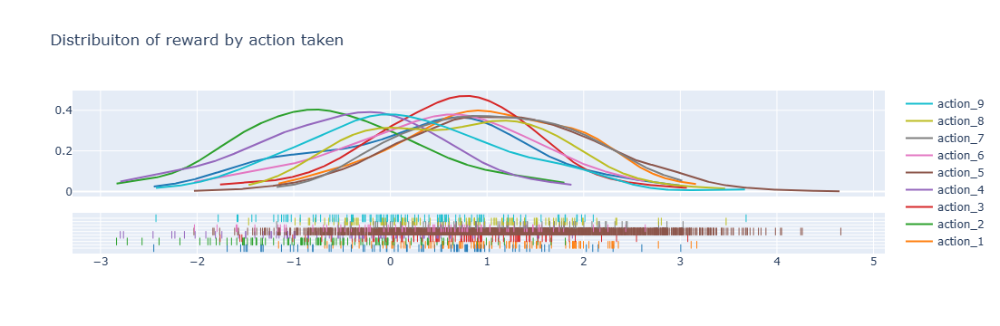

In [6]:
# 30% exploration
agent = Agent(env, 0.30)
epsilon30_g_df = play_wrapper('epsilon30-greedy agent', env, agent)
dfs = [epsilon30_g_df.loc[epsilon30_g_df['epsilon30-greedy agent action']==a,'r'] for a in range(10)]
labels = ['action_'+str(i) for i in range(10)]

_ = dist_plots(dfs, labels, "Distribuiton of reward by action taken",
           bin_size=0.05, 
           show_hist=False)

## Homework

In the sample code, the decaying epsilon is a linear decay schedule. 

```
np.linspace(self.start_epsilon, self.end_epsilon, n_steps)
```

where $\epsilon$ changes from `start-epsilon` to `end_epsilon` in a constant speed at each step.

Based the sample code, do some more research on different decay schedule.

* Schedule 1: $\large \epsilon_t = \frac {1}{t}$
* Schedule 2: $\large \epsilon_t = \frac {1}{t^2}$

Do some experiments, compare among them and with the linear decay schedule, then write down your findings.

* Schedule 1: $\large \epsilon_t = \frac {1}{t}$

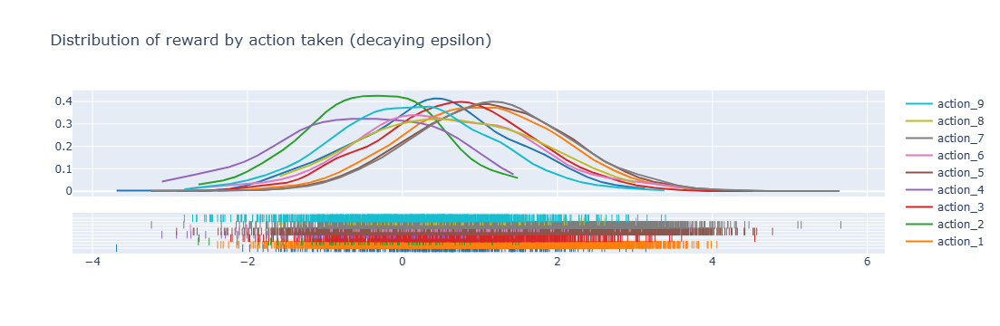

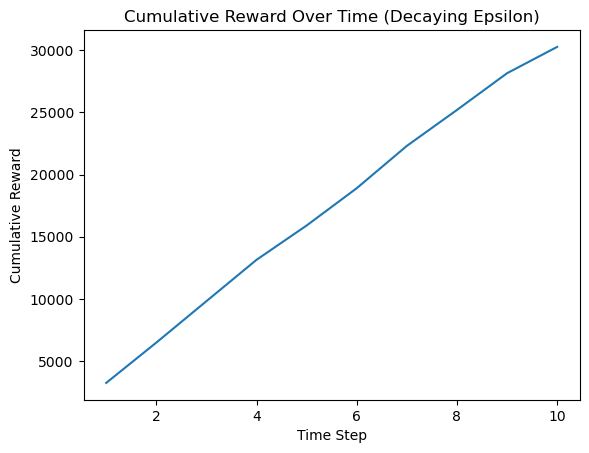

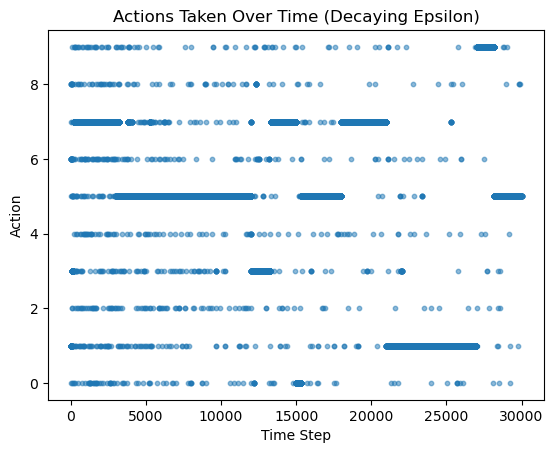

In [7]:
import matplotlib.pyplot as plt

# Parameters
n_steps = 100
sample_interval = 10  # Collect data every 10 steps
action_rewards = {i: [] for i in range(10)} 
cumulative_rewards = []  
actions_taken = []  
cumulative_reward = 0


for t in range(1, n_steps + 1):
    epsilon = 1 / t  # Decaying epsilon
    agent = Agent(env, epsilon)  
    
    
    if t % sample_interval == 0:
        epsilont_g_df = play_wrapper('epsilon-decaying agent', env, agent)
        
       
        for a in range(10):
            
            rewards = epsilont_g_df.loc[epsilont_g_df['epsilon-decaying agent action'] == a, 'r'].dropna().tolist()
            action_rewards[a].extend(rewards)
        
       
        total_rewards = epsilont_g_df['r'].sum()  # Sum rewards at this time step
        cumulative_reward += total_rewards
        cumulative_rewards.append(cumulative_reward)

        
        actions_taken.extend(epsilont_g_df['epsilon-decaying agent action'].tolist())


dfs = [rewards for rewards in action_rewards.values() if len(rewards) >= 2]  # Filter actions with at least 2 rewards
labels = ['action_' + str(i) for i, rewards in action_rewards.items() if len(rewards) >= 2]


if len(dfs) > 0:
    _ = dist_plots(dfs, labels, "Distribution of reward by action taken (decaying epsilon)",
                   bin_size=0.05, show_hist=False)
else:
    print("No data available to plot.")

# Cumulative rewards over time
plt.figure()
plt.plot(range(1, len(cumulative_rewards) + 1), cumulative_rewards)
plt.title("Cumulative Reward Over Time (Decaying Epsilon)")
plt.xlabel("Time Step")
plt.ylabel("Cumulative Reward")
plt.show()

# Actions taken over time to visualize action diversity
plt.figure()
plt.scatter(range(1, len(actions_taken) + 1), actions_taken, s=10, alpha=0.5)
plt.title("Actions Taken Over Time (Decaying Epsilon)")
plt.xlabel("Time Step")
plt.ylabel("Action")
plt.show()


* Schedule 2: $\large \epsilon_t = \frac {1}{t^2}$

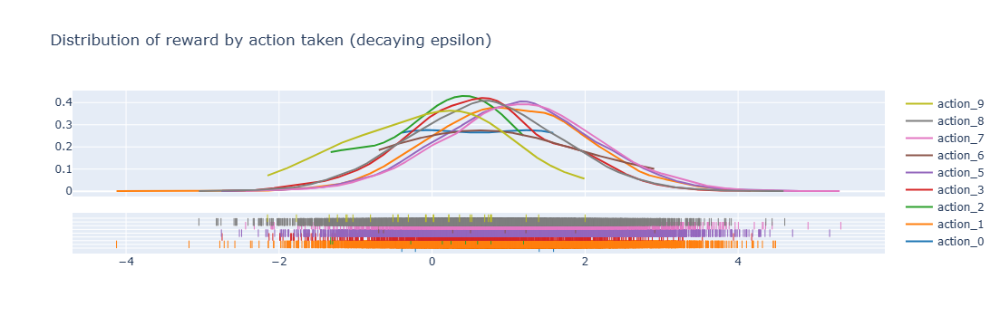

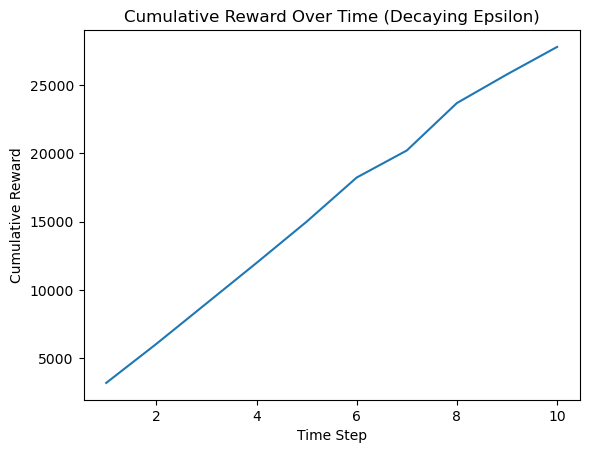

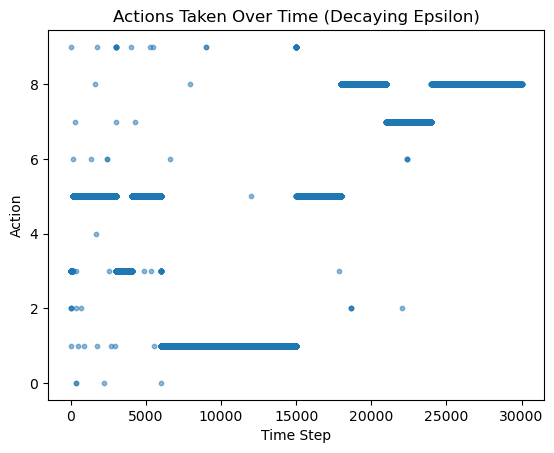

In [8]:
# Parameters
n_steps = 100
sample_interval = 10  # Collect data every 10 steps
action_rewards = {i: [] for i in range(10)}  
cumulative_rewards = []  
actions_taken = []  
cumulative_reward = 0

for t in range(1, n_steps + 1):
    epsilon = 1 / (t**2)  # Decaying epsilon
    agent = Agent(env, epsilon)  
    
    if t % sample_interval == 0:
        epsilont2_g_df = play_wrapper('epsilon-decaying agent', env, agent)
    
        for a in range(10):
            rewards = epsilont2_g_df.loc[epsilont2_g_df['epsilon-decaying agent action'] == a, 'r'].dropna().tolist()
            action_rewards[a].extend(rewards)
        
        total_rewards = epsilont2_g_df['r'].sum()  #
        cumulative_reward += total_rewards
        cumulative_rewards.append(cumulative_reward)

        actions_taken.extend(epsilont2_g_df['epsilon-decaying agent action'].tolist())


dfs = [rewards for rewards in action_rewards.values() if len(rewards) >= 2] 
labels = ['action_' + str(i) for i, rewards in action_rewards.items() if len(rewards) >= 2]

if len(dfs) > 0:
    _ = dist_plots(dfs, labels, "Distribution of reward by action taken (decaying epsilon)",
                   bin_size=0.05, show_hist=False)
else:
    print("No data available to plot.")

# Cumulative rewards over time
plt.figure()
plt.plot(range(1, len(cumulative_rewards) + 1), cumulative_rewards)
plt.title("Cumulative Reward Over Time (Decaying Epsilon)")
plt.xlabel("Time Step")
plt.ylabel("Cumulative Reward")
plt.show()

# Actions taken over time to visualize action diversity
plt.figure()
plt.scatter(range(1, len(actions_taken) + 1), actions_taken, s=10, alpha=0.5)
plt.title("Actions Taken Over Time (Decaying Epsilon)")
plt.xlabel("Time Step")
plt.ylabel("Action")
plt.show()


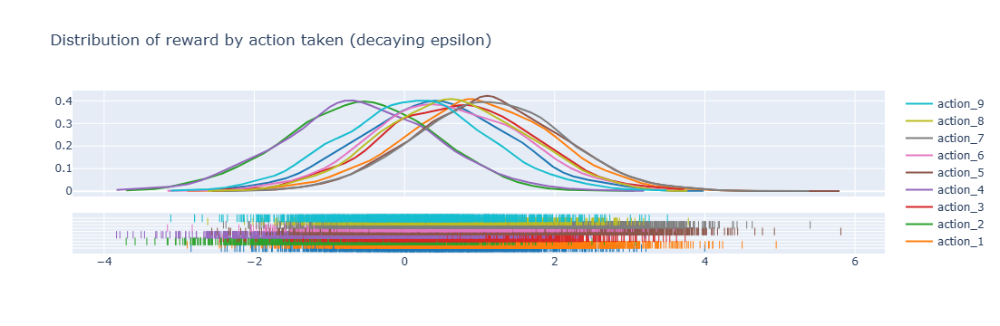

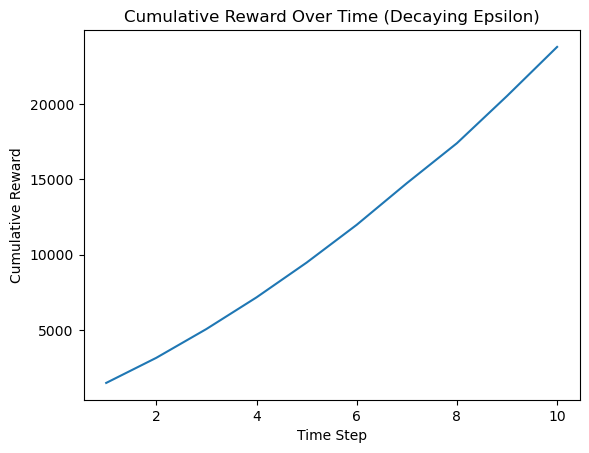

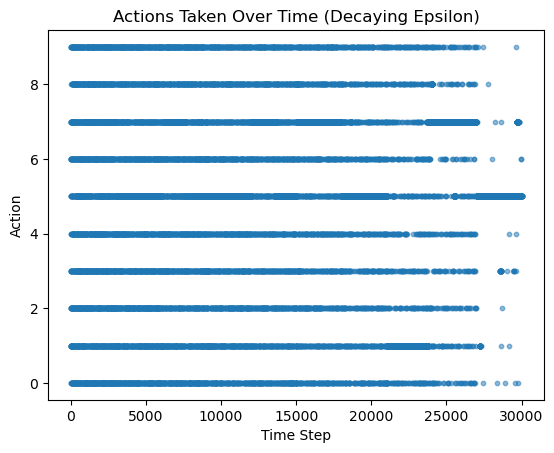

In [9]:
import numpy as np

n_steps = 100
start_epsilon = 1.0  # 100% exploration
end_epsilon = 0.01  # minimal exploration

# linear decay schedule
epsilon_values = np.linspace(start_epsilon, end_epsilon, n_steps)

action_rewards = {i: [] for i in range(10)} 
cumulative_reward = 0
cumulative_rewards = []  
actions_taken = []  

for t in range(1, n_steps + 1):
    epsilon = epsilon_values[t-1]  
    agent = Agent(env, epsilon)  
    
    if t % sample_interval == 0:
        epsilon_g_df = play_wrapper('epsilon-decaying agent', env, agent)
        
        for a in range(10):
            rewards = epsilon_g_df.loc[epsilon_g_df['epsilon-decaying agent action'] == a, 'r'].dropna().tolist()
            action_rewards[a].extend(rewards)
        
        total_rewards = epsilon_g_df['r'].sum()
        cumulative_reward += total_rewards
        cumulative_rewards.append(cumulative_reward)

        actions_taken.extend(epsilon_g_df['epsilon-decaying agent action'].tolist())

dfs = [rewards for rewards in action_rewards.values() if len(rewards) >= 2]  # Filter actions with at least 2 rewards
labels = ['action_' + str(i) for i, rewards in action_rewards.items() if len(rewards) >= 2]

if len(dfs) > 0:
    _ = dist_plots(dfs, labels, "Distribution of reward by action taken (decaying epsilon)",
                   bin_size=0.05, show_hist=False)
else:
    print("No data available to plot.")

# Cumulative rewards over time
plt.figure()
plt.plot(range(1, len(cumulative_rewards) + 1), cumulative_rewards)
plt.title("Cumulative Reward Over Time (Decaying Epsilon)")
plt.xlabel("Time Step")
plt.ylabel("Cumulative Reward")
plt.show()

# Actions taken over time to visualize action diversity
plt.figure()
plt.scatter(range(1, len(actions_taken) + 1), actions_taken, s=10, alpha=0.5)
plt.title("Actions Taken Over Time (Decaying Epsilon)")
plt.xlabel("Time Step")
plt.ylabel("Action")
plt.show()


1/t decay schedule results in more gradual exploration over time. The agent continues exploring for longer, which results in a more balanced distribution of rewards across actions.

1/t^2 decay schedule shows more aggressive exploitation. Since epsilon decays more rapidly, the agent shifts to exploitation much sooner. 

Similar to 1/t, linear decay provides a gradual reduction in exploration, allowing the agent to try out more actions before converging on the best strategy.